# A Diffusion Model from Scratch in Pytorch

In this notebook I want to build a very simple (as few code as possible) Diffusion Model for generating car images. I will explain all the theoretical details in the YouTube video.


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)

## Investigating the dataset

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

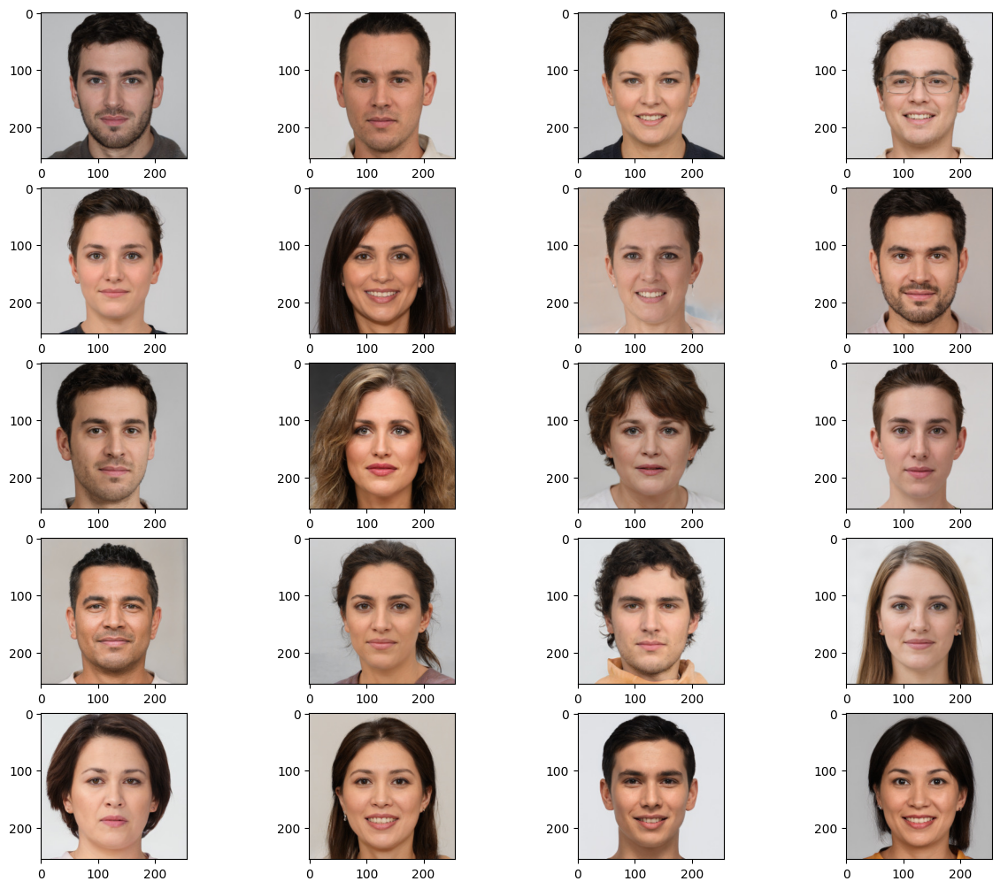

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision import datasets

def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = datasets.ImageFolder(root='./kepek')
show_images(data)

Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors ect.

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [2]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Let's test it on our dataset ...

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 32

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]

    data_transform = transforms.Compose(data_transforms)

    train = datasets.ImageFolder(root='./kepek', transform=data_transform)

    test = datasets.ImageFolder(root='./kepek_2', transform=data_transform)

    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

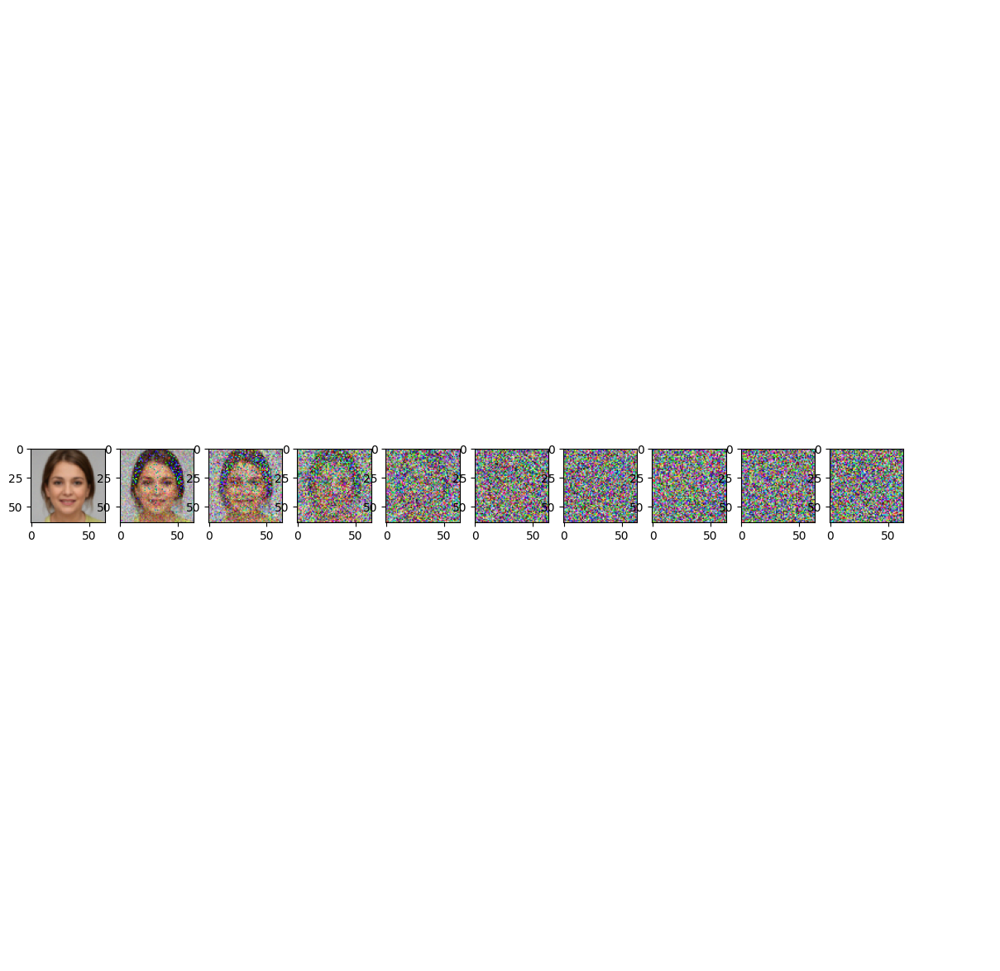

In [4]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [5]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [6]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [7]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

In [8]:
# after finishing with model A
import gc
gc.collect()              # Python GC
torch.cuda.empty_cache()  # return cached GPU memory to OS


## Training

Epoch 0 | step 000 Loss: 0.8079308867454529 


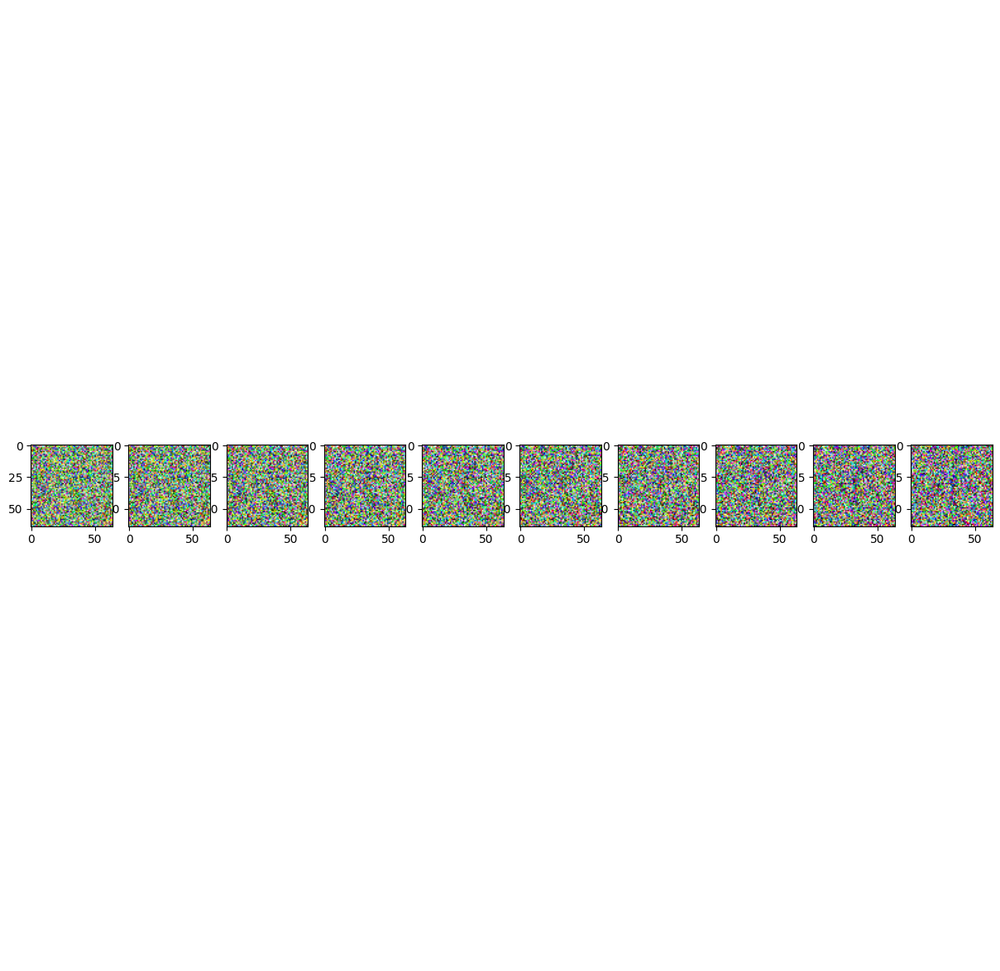

Epoch 0 | step 001 Loss: 0.7572073936462402 
Epoch 0 | step 002 Loss: 0.72193443775177 
Epoch 0 | step 003 Loss: 0.6871069669723511 
Epoch 0 | step 004 Loss: 0.6572624444961548 
Epoch 0 | step 005 Loss: 0.620220959186554 
Epoch 0 | step 006 Loss: 0.5925633907318115 
Epoch 0 | step 007 Loss: 0.5667626261711121 
Epoch 0 | step 008 Loss: 0.5287951231002808 
Epoch 0 | step 009 Loss: 0.5021845102310181 
Epoch 0 | step 010 Loss: 0.476168692111969 
Epoch 0 | step 011 Loss: 0.4574495255947113 
Epoch 0 | step 012 Loss: 0.4184584319591522 
Epoch 0 | step 013 Loss: 0.43440985679626465 
Epoch 0 | step 014 Loss: 0.4172571897506714 
Epoch 0 | step 015 Loss: 0.39034923911094666 
Epoch 0 | step 016 Loss: 0.3880062997341156 
Epoch 0 | step 017 Loss: 0.39421090483665466 
Epoch 0 | step 018 Loss: 0.36331889033317566 
Epoch 0 | step 019 Loss: 0.3466564118862152 
Epoch 0 | step 020 Loss: 0.38219043612480164 
Epoch 0 | step 021 Loss: 0.3325817286968231 
Epoch 0 | step 022 Loss: 0.3772997260093689 
Epoch 0 |

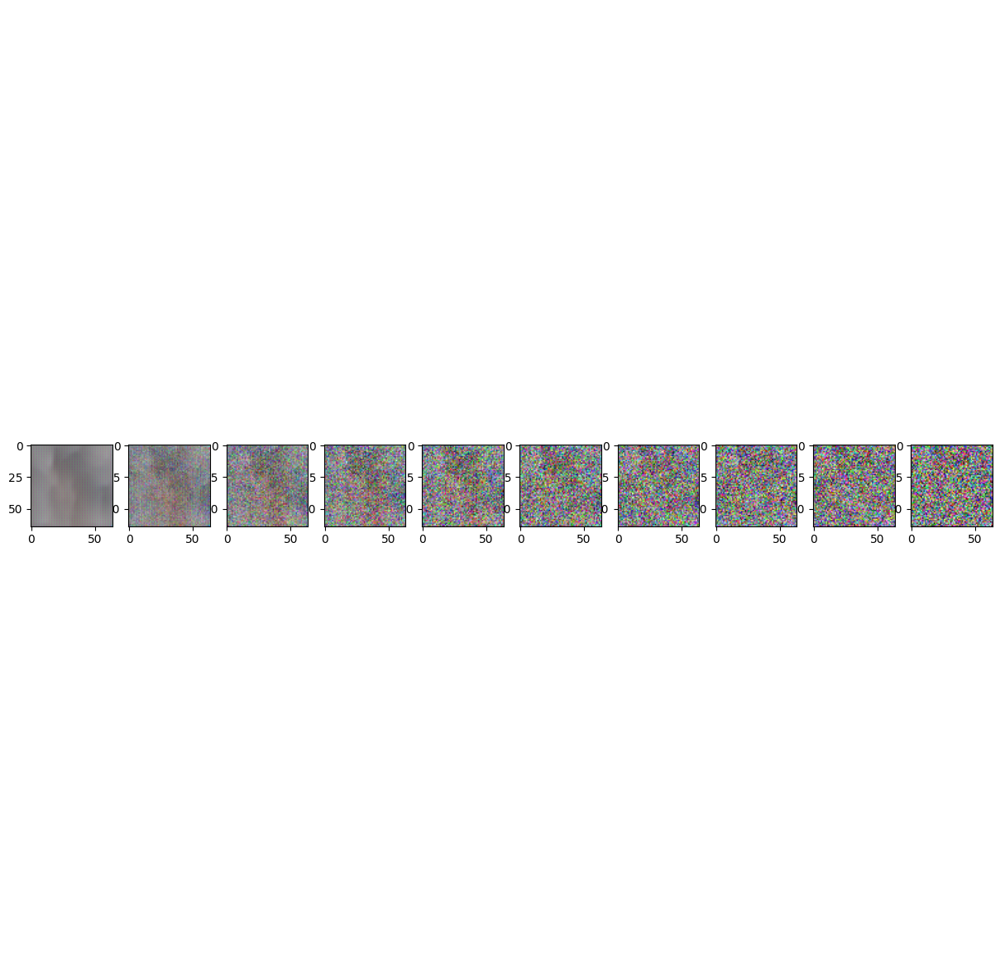

Epoch 5 | step 001 Loss: 0.15501108765602112 
Epoch 5 | step 002 Loss: 0.14255744218826294 
Epoch 5 | step 003 Loss: 0.13220027089118958 
Epoch 5 | step 004 Loss: 0.15429319441318512 
Epoch 5 | step 005 Loss: 0.14785334467887878 
Epoch 5 | step 006 Loss: 0.1533636599779129 
Epoch 5 | step 007 Loss: 0.1447044014930725 
Epoch 5 | step 008 Loss: 0.17307332158088684 
Epoch 5 | step 009 Loss: 0.162953183054924 
Epoch 5 | step 010 Loss: 0.14460334181785583 
Epoch 5 | step 011 Loss: 0.1473080813884735 
Epoch 5 | step 012 Loss: 0.14726822078227997 
Epoch 5 | step 013 Loss: 0.13062667846679688 
Epoch 5 | step 014 Loss: 0.15281033515930176 
Epoch 5 | step 015 Loss: 0.135882169008255 
Epoch 5 | step 016 Loss: 0.1550716906785965 
Epoch 5 | step 017 Loss: 0.13546809554100037 
Epoch 5 | step 018 Loss: 0.14901553094387054 
Epoch 5 | step 019 Loss: 0.13137251138687134 
Epoch 5 | step 020 Loss: 0.23947417736053467 
Epoch 5 | step 021 Loss: 0.15835751593112946 
Epoch 5 | step 022 Loss: 0.141137003898620

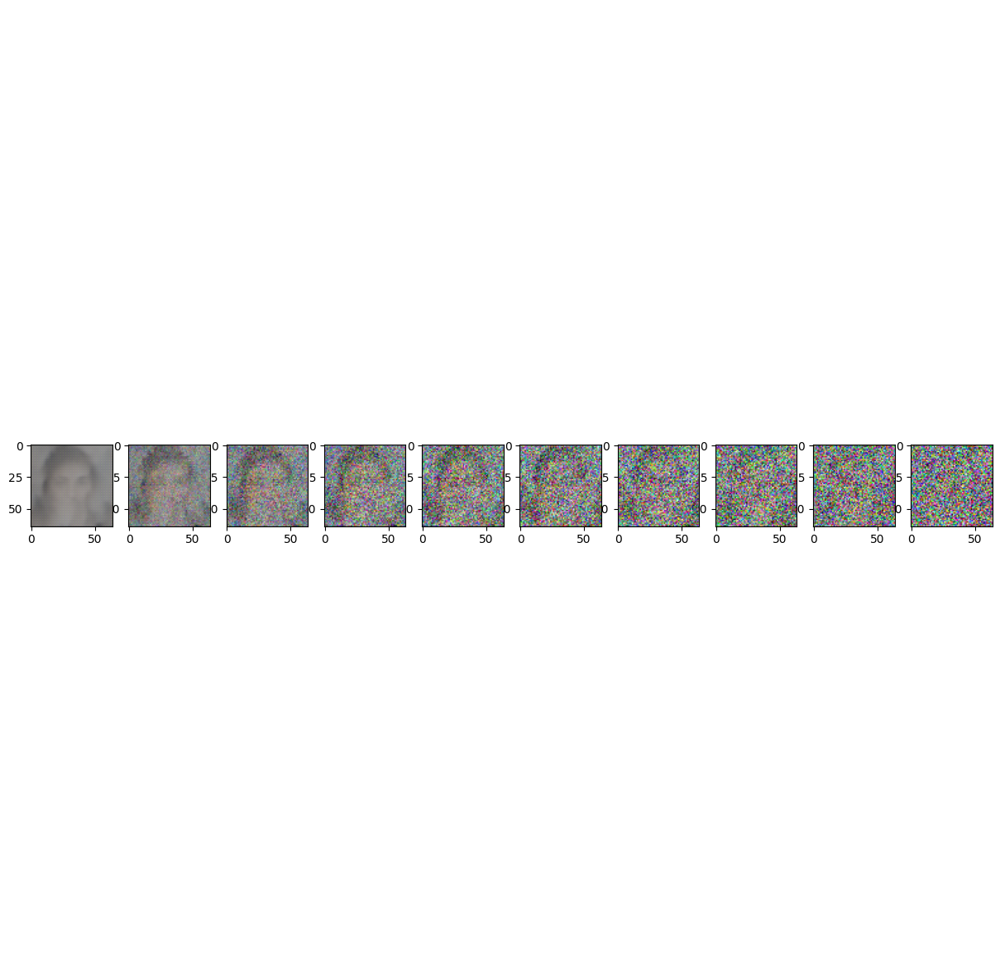

Epoch 10 | step 001 Loss: 0.11694937944412231 
Epoch 10 | step 002 Loss: 0.1254444718360901 
Epoch 10 | step 003 Loss: 0.11727070063352585 
Epoch 10 | step 004 Loss: 0.13279622793197632 
Epoch 10 | step 005 Loss: 0.13885235786437988 
Epoch 10 | step 006 Loss: 0.12383429706096649 
Epoch 10 | step 007 Loss: 0.10186637938022614 
Epoch 10 | step 008 Loss: 0.14870011806488037 
Epoch 10 | step 009 Loss: 0.10880625247955322 
Epoch 10 | step 010 Loss: 0.12744247913360596 
Epoch 10 | step 011 Loss: 0.11856044828891754 
Epoch 10 | step 012 Loss: 0.11821796745061874 
Epoch 10 | step 013 Loss: 0.162639781832695 
Epoch 10 | step 014 Loss: 0.1162310466170311 
Epoch 10 | step 015 Loss: 0.12216196954250336 
Epoch 10 | step 016 Loss: 0.12950053811073303 
Epoch 10 | step 017 Loss: 0.10130223631858826 
Epoch 10 | step 018 Loss: 0.12243519723415375 
Epoch 10 | step 019 Loss: 0.1337016075849533 
Epoch 10 | step 020 Loss: 0.11581280082464218 
Epoch 10 | step 021 Loss: 0.11501973867416382 
Epoch 10 | step 02

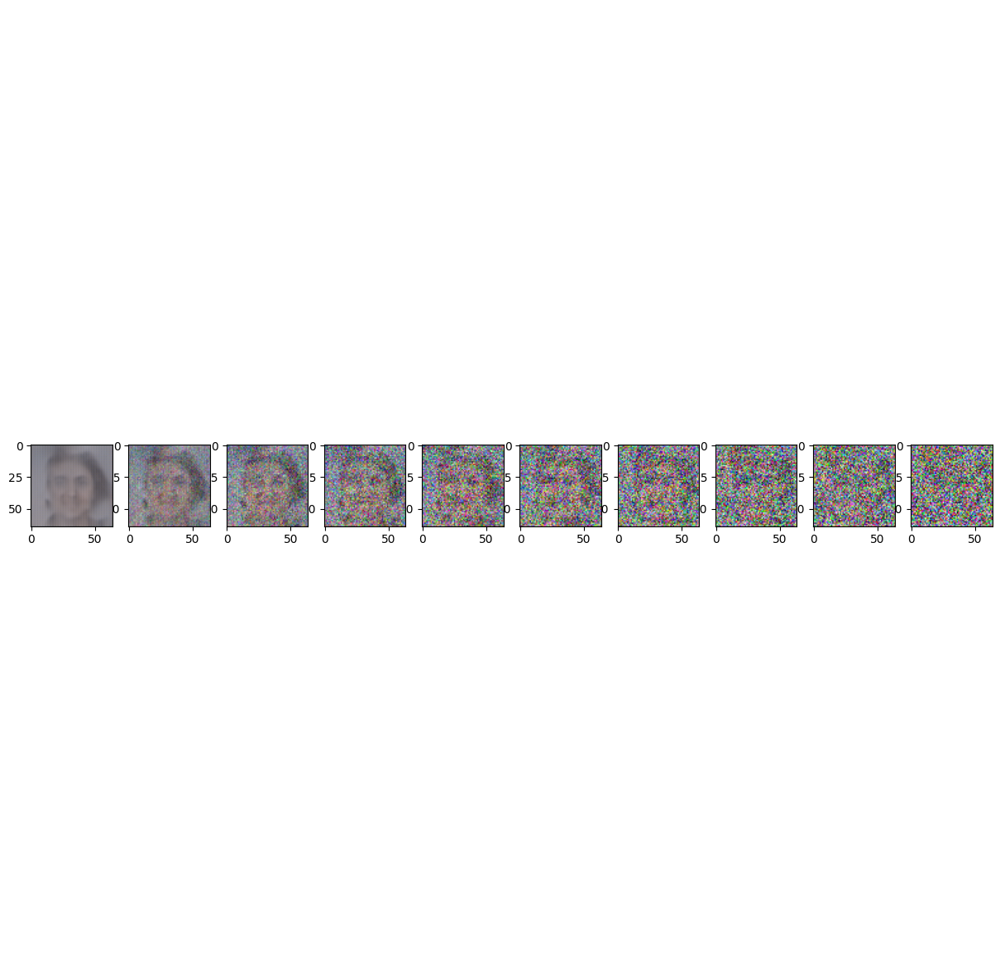

Epoch 15 | step 001 Loss: 0.1176978051662445 
Epoch 15 | step 002 Loss: 0.11845239251852036 
Epoch 15 | step 003 Loss: 0.09053927659988403 
Epoch 15 | step 004 Loss: 0.10060805082321167 
Epoch 15 | step 005 Loss: 0.13088762760162354 
Epoch 15 | step 006 Loss: 0.11251740157604218 
Epoch 15 | step 007 Loss: 0.1194060891866684 
Epoch 15 | step 008 Loss: 0.09463910758495331 
Epoch 15 | step 009 Loss: 0.09326981008052826 
Epoch 15 | step 010 Loss: 0.08896014094352722 
Epoch 15 | step 011 Loss: 0.09348069131374359 
Epoch 15 | step 012 Loss: 0.11024731397628784 
Epoch 15 | step 013 Loss: 0.12770718336105347 
Epoch 15 | step 014 Loss: 0.0999884307384491 
Epoch 15 | step 015 Loss: 0.12316276133060455 
Epoch 15 | step 016 Loss: 0.13099446892738342 
Epoch 15 | step 017 Loss: 0.11192849278450012 
Epoch 15 | step 018 Loss: 0.12872761487960815 
Epoch 15 | step 019 Loss: 0.10585736483335495 
Epoch 15 | step 020 Loss: 0.1386798620223999 
Epoch 15 | step 021 Loss: 0.11378016322851181 
Epoch 15 | step 0

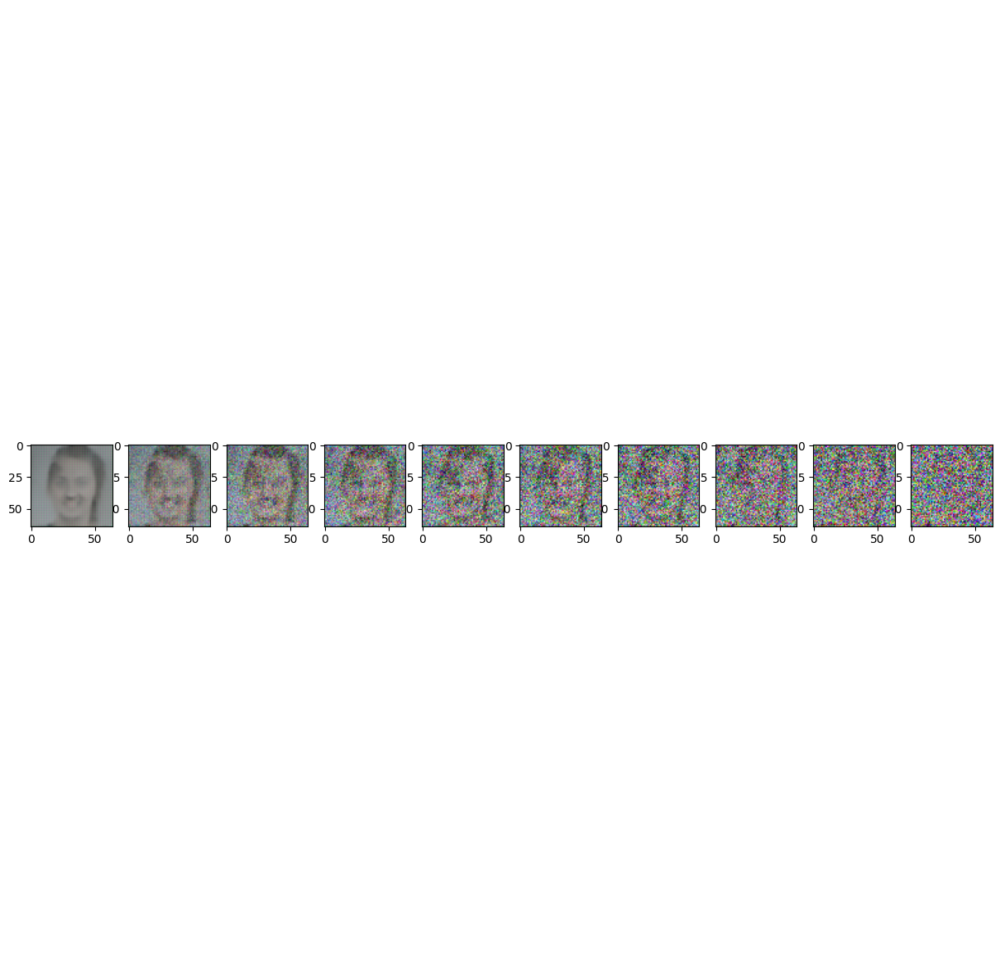

Epoch 20 | step 001 Loss: 0.10197529196739197 
Epoch 20 | step 002 Loss: 0.13778188824653625 
Epoch 20 | step 003 Loss: 0.11632594466209412 
Epoch 20 | step 004 Loss: 0.11807163804769516 
Epoch 20 | step 005 Loss: 0.0985671728849411 
Epoch 20 | step 006 Loss: 0.10283452272415161 
Epoch 20 | step 007 Loss: 0.10339047014713287 
Epoch 20 | step 008 Loss: 0.12462848424911499 
Epoch 20 | step 009 Loss: 0.0844583511352539 
Epoch 20 | step 010 Loss: 0.09567111730575562 
Epoch 20 | step 011 Loss: 0.1204129308462143 
Epoch 20 | step 012 Loss: 0.09784355759620667 
Epoch 20 | step 013 Loss: 0.11891227960586548 
Epoch 20 | step 014 Loss: 0.12051516771316528 
Epoch 20 | step 015 Loss: 0.1133098229765892 
Epoch 20 | step 016 Loss: 0.10302825272083282 
Epoch 20 | step 017 Loss: 0.10021282732486725 
Epoch 20 | step 018 Loss: 0.13396844267845154 
Epoch 20 | step 019 Loss: 0.11617790162563324 
Epoch 20 | step 020 Loss: 0.09435068070888519 
Epoch 20 | step 021 Loss: 0.08430401980876923 
Epoch 20 | step 0

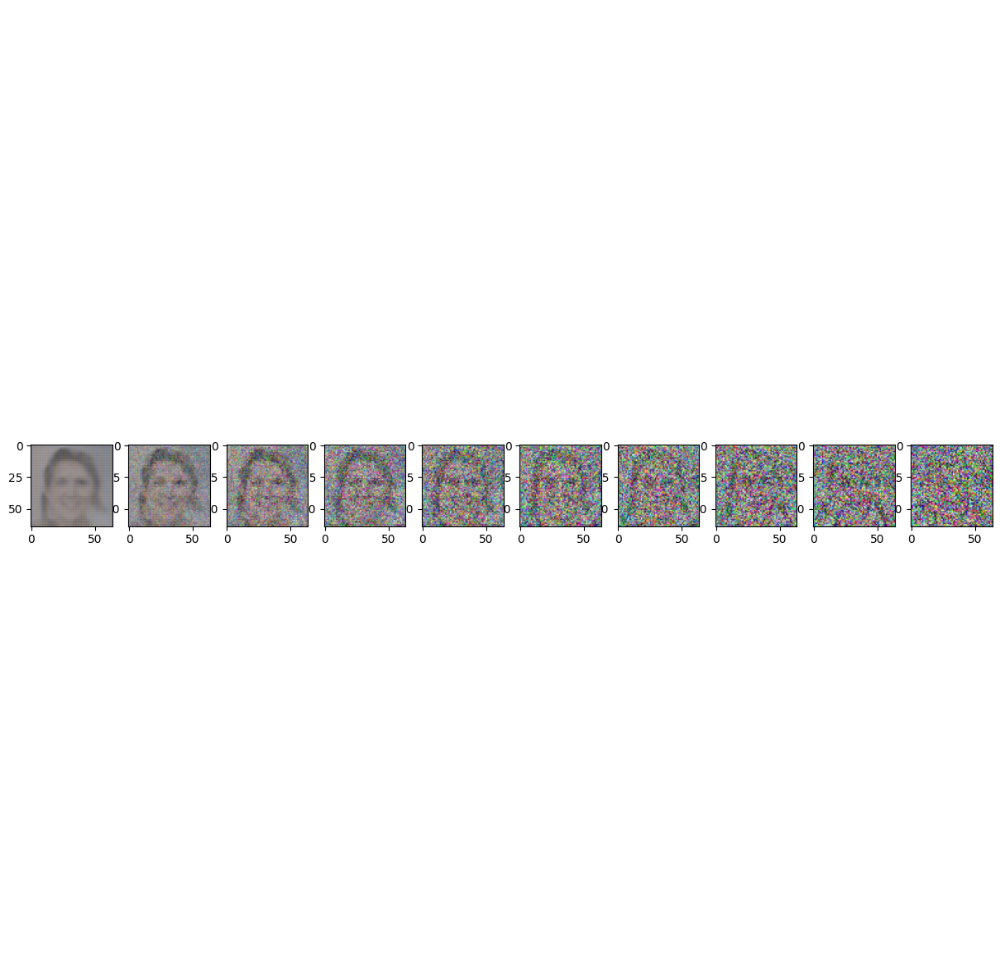

Epoch 25 | step 001 Loss: 0.09720920771360397 
Epoch 25 | step 002 Loss: 0.09565061330795288 
Epoch 25 | step 003 Loss: 0.090666763484478 
Epoch 25 | step 004 Loss: 0.09708907455205917 
Epoch 25 | step 005 Loss: 0.11232640594244003 
Epoch 25 | step 006 Loss: 0.10129748284816742 
Epoch 25 | step 007 Loss: 0.10140343755483627 
Epoch 25 | step 008 Loss: 0.0999273881316185 
Epoch 25 | step 009 Loss: 0.08857232332229614 
Epoch 25 | step 010 Loss: 0.13422982394695282 
Epoch 25 | step 011 Loss: 0.087806835770607 
Epoch 25 | step 012 Loss: 0.09005217999219894 
Epoch 25 | step 013 Loss: 0.12635555863380432 
Epoch 25 | step 014 Loss: 0.09848776459693909 
Epoch 25 | step 015 Loss: 0.11094387620687485 
Epoch 25 | step 016 Loss: 0.11139430850744247 
Epoch 25 | step 017 Loss: 0.099248968064785 
Epoch 25 | step 018 Loss: 0.10709637403488159 
Epoch 25 | step 019 Loss: 0.10329879820346832 
Epoch 25 | step 020 Loss: 0.13487446308135986 
Epoch 25 | step 021 Loss: 0.09261783212423325 
Epoch 25 | step 022 

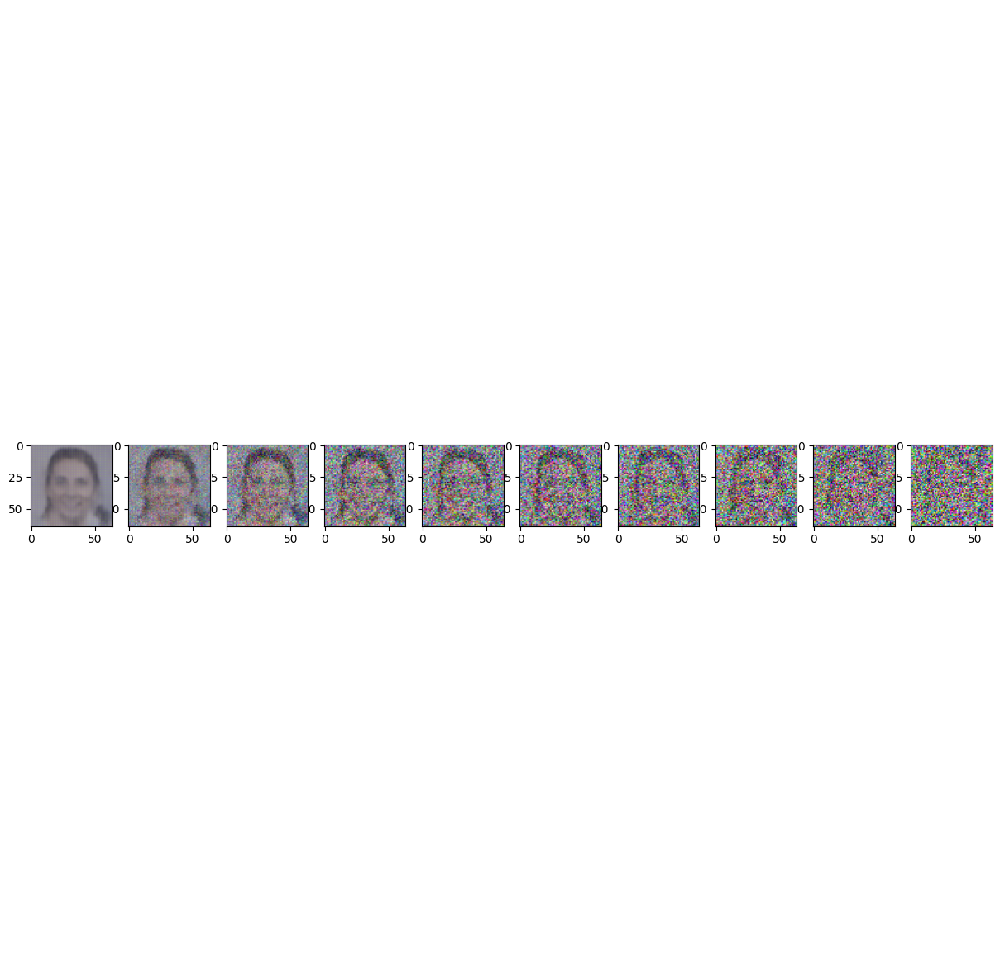

Epoch 30 | step 001 Loss: 0.0958523079752922 
Epoch 30 | step 002 Loss: 0.11302070319652557 
Epoch 30 | step 003 Loss: 0.10687485337257385 
Epoch 30 | step 004 Loss: 0.09826286882162094 
Epoch 30 | step 005 Loss: 0.09766285121440887 
Epoch 30 | step 006 Loss: 0.09766029566526413 
Epoch 30 | step 007 Loss: 0.1153654083609581 
Epoch 30 | step 008 Loss: 0.10545806586742401 
Epoch 30 | step 009 Loss: 0.08580426871776581 
Epoch 30 | step 010 Loss: 0.09494855254888535 
Epoch 30 | step 011 Loss: 0.0951523706316948 
Epoch 30 | step 012 Loss: 0.10624342411756516 
Epoch 30 | step 013 Loss: 0.1055065244436264 
Epoch 30 | step 014 Loss: 0.0841182991862297 
Epoch 30 | step 015 Loss: 0.08077974617481232 
Epoch 30 | step 016 Loss: 0.09349127858877182 
Epoch 30 | step 017 Loss: 0.08702157437801361 
Epoch 30 | step 018 Loss: 0.12581336498260498 
Epoch 30 | step 019 Loss: 0.11322759836912155 
Epoch 30 | step 020 Loss: 0.07912107557058334 
Epoch 30 | step 021 Loss: 0.08978945016860962 
Epoch 30 | step 02

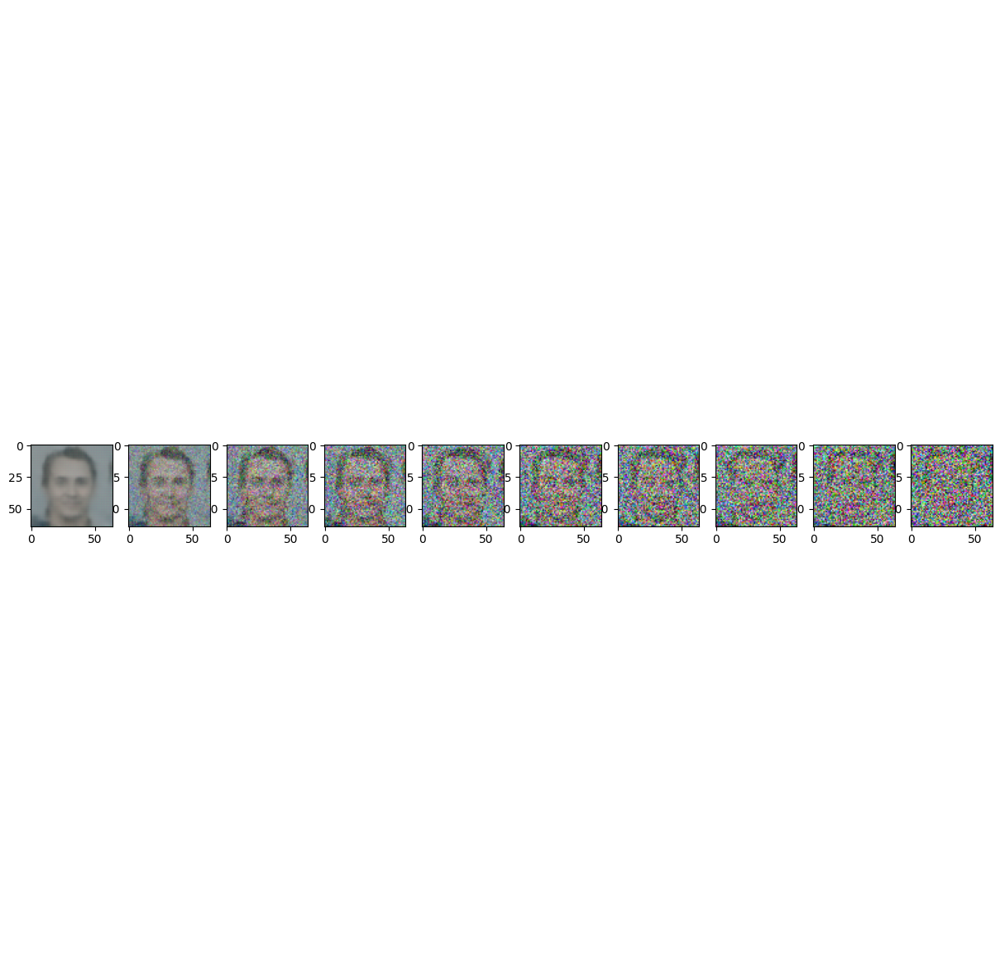

Epoch 35 | step 001 Loss: 0.09642799943685532 
Epoch 35 | step 002 Loss: 0.08778824657201767 
Epoch 35 | step 003 Loss: 0.08646401017904282 
Epoch 35 | step 004 Loss: 0.08541467785835266 
Epoch 35 | step 005 Loss: 0.09278716892004013 
Epoch 35 | step 006 Loss: 0.0877188891172409 
Epoch 35 | step 007 Loss: 0.10299967229366302 
Epoch 35 | step 008 Loss: 0.1168217882514 
Epoch 35 | step 009 Loss: 0.09936141967773438 
Epoch 35 | step 010 Loss: 0.07446804642677307 
Epoch 35 | step 011 Loss: 0.11053084582090378 
Epoch 35 | step 012 Loss: 0.07561074197292328 
Epoch 35 | step 013 Loss: 0.10248099267482758 
Epoch 35 | step 014 Loss: 0.13358834385871887 
Epoch 35 | step 015 Loss: 0.08099368214607239 
Epoch 35 | step 016 Loss: 0.08601079881191254 
Epoch 35 | step 017 Loss: 0.09350210428237915 
Epoch 35 | step 018 Loss: 0.09345149993896484 
Epoch 35 | step 019 Loss: 0.09310567378997803 
Epoch 35 | step 020 Loss: 0.10436795651912689 
Epoch 35 | step 021 Loss: 0.10162388533353806 
Epoch 35 | step 02

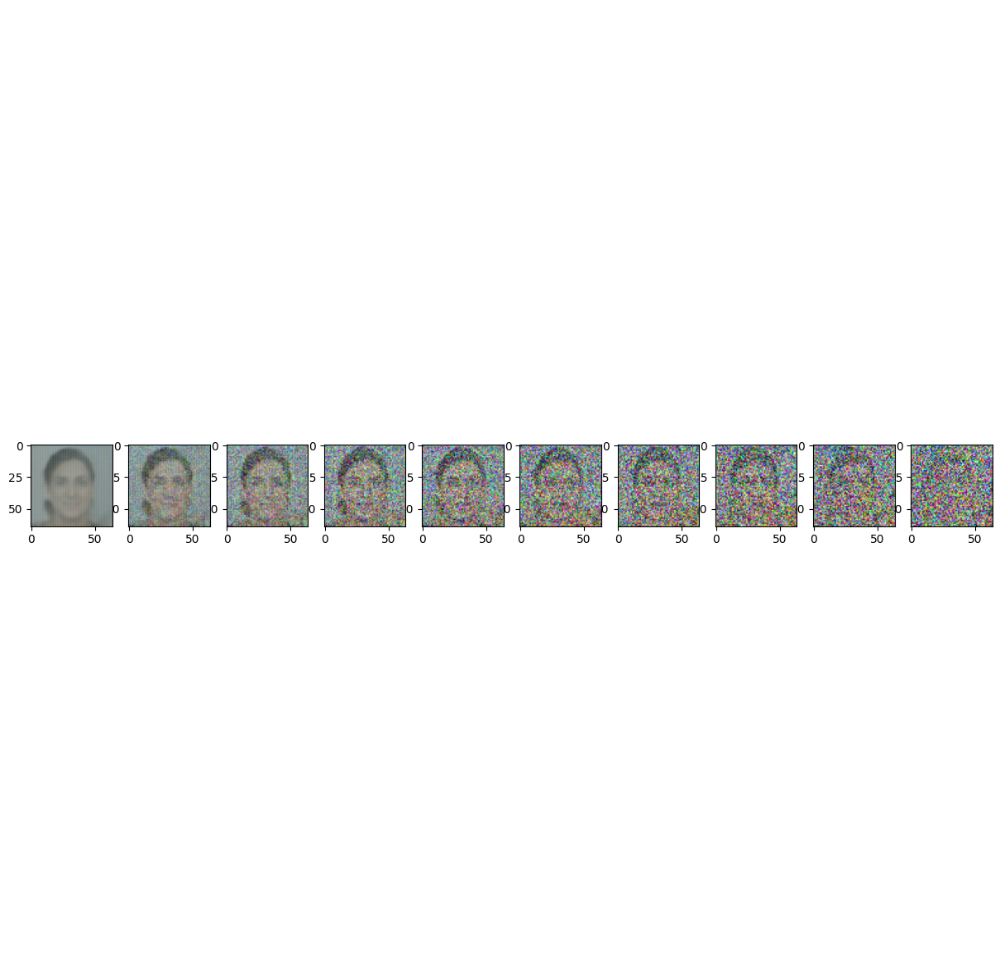

Epoch 40 | step 001 Loss: 0.09206168353557587 
Epoch 40 | step 002 Loss: 0.10052891820669174 
Epoch 40 | step 003 Loss: 0.08870106190443039 
Epoch 40 | step 004 Loss: 0.1012878268957138 
Epoch 40 | step 005 Loss: 0.07777349650859833 
Epoch 40 | step 006 Loss: 0.08384862542152405 
Epoch 40 | step 007 Loss: 0.0889931321144104 
Epoch 40 | step 008 Loss: 0.08078398555517197 
Epoch 40 | step 009 Loss: 0.07827883213758469 
Epoch 40 | step 010 Loss: 0.11337646842002869 
Epoch 40 | step 011 Loss: 0.1113334521651268 
Epoch 40 | step 012 Loss: 0.07511477172374725 
Epoch 40 | step 013 Loss: 0.09885601699352264 
Epoch 40 | step 014 Loss: 0.08539487421512604 
Epoch 40 | step 015 Loss: 0.09157192707061768 
Epoch 40 | step 016 Loss: 0.10225145518779755 
Epoch 40 | step 017 Loss: 0.09119417518377304 
Epoch 40 | step 018 Loss: 0.0843919962644577 
Epoch 40 | step 019 Loss: 0.08131590485572815 
Epoch 40 | step 020 Loss: 0.07415859401226044 
Epoch 40 | step 021 Loss: 0.07649653404951096 
Epoch 40 | step 0

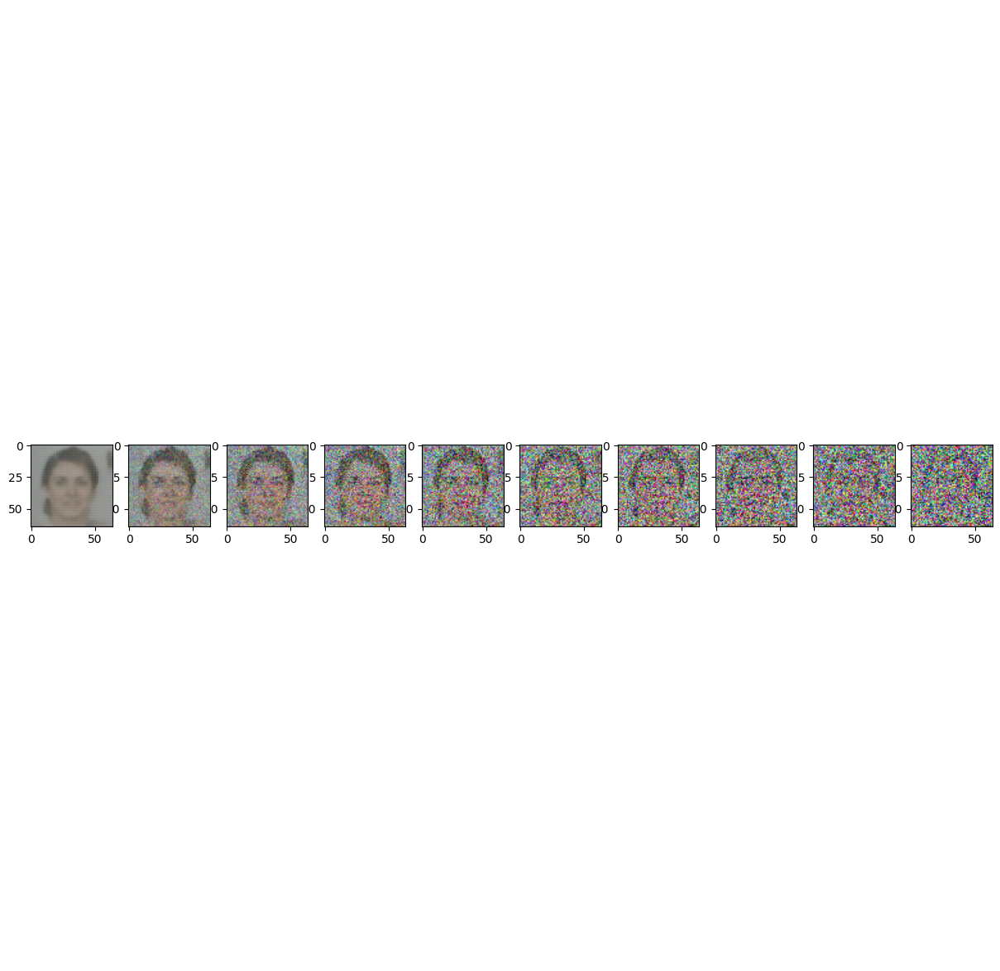

Epoch 45 | step 001 Loss: 0.1204458475112915 
Epoch 45 | step 002 Loss: 0.10987230390310287 
Epoch 45 | step 003 Loss: 0.1022677943110466 
Epoch 45 | step 004 Loss: 0.09933760017156601 
Epoch 45 | step 005 Loss: 0.09985395520925522 
Epoch 45 | step 006 Loss: 0.08230595290660858 
Epoch 45 | step 007 Loss: 0.09537351131439209 
Epoch 45 | step 008 Loss: 0.10269640386104584 
Epoch 45 | step 009 Loss: 0.09874115884304047 
Epoch 45 | step 010 Loss: 0.1025335043668747 
Epoch 45 | step 011 Loss: 0.10850497335195541 
Epoch 45 | step 012 Loss: 0.09781074523925781 
Epoch 45 | step 013 Loss: 0.08850999921560287 
Epoch 45 | step 014 Loss: 0.11524936556816101 
Epoch 45 | step 015 Loss: 0.08661545813083649 
Epoch 45 | step 016 Loss: 0.08745994418859482 
Epoch 45 | step 017 Loss: 0.07193419337272644 
Epoch 45 | step 018 Loss: 0.07864019274711609 
Epoch 45 | step 019 Loss: 0.067348912358284 
Epoch 45 | step 020 Loss: 0.10501419007778168 
Epoch 45 | step 021 Loss: 0.10224352777004242 
Epoch 45 | step 02

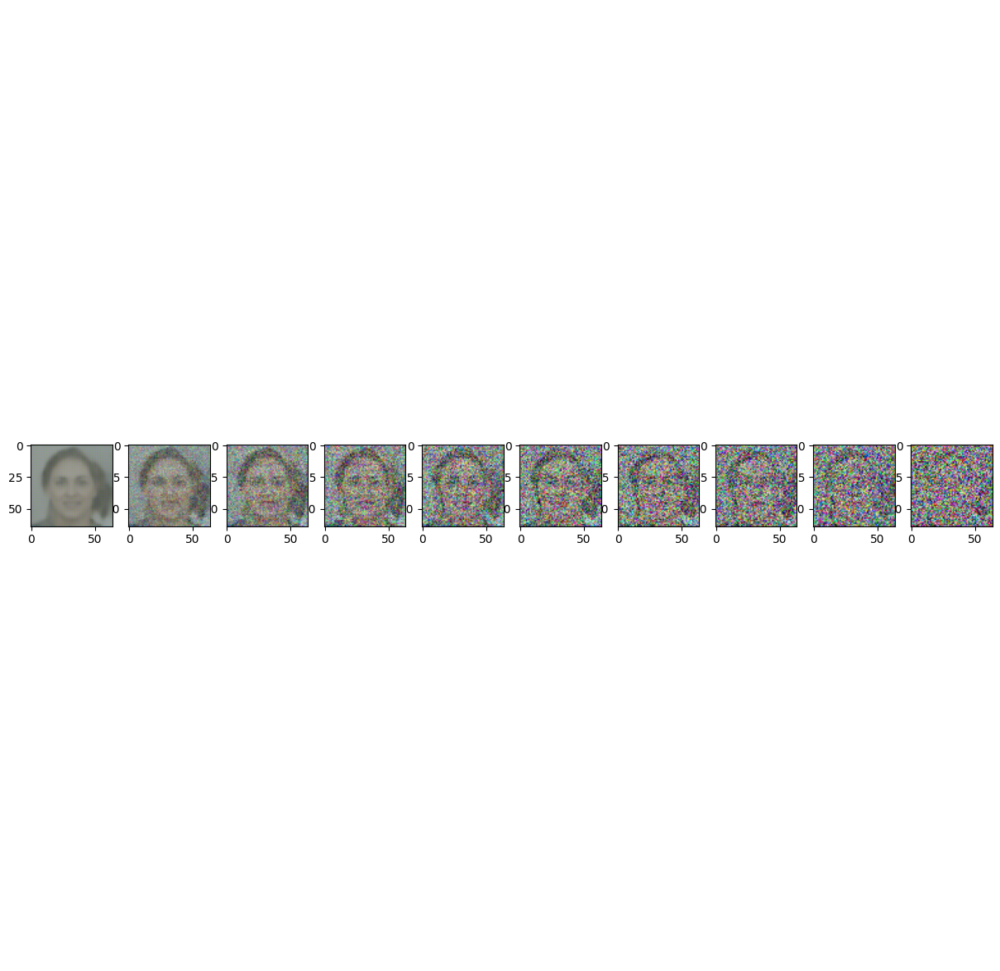

Epoch 50 | step 001 Loss: 0.077244833111763 
Epoch 50 | step 002 Loss: 0.09165288507938385 
Epoch 50 | step 003 Loss: 0.0662468671798706 
Epoch 50 | step 004 Loss: 0.06862755864858627 
Epoch 50 | step 005 Loss: 0.09559841454029083 
Epoch 50 | step 006 Loss: 0.11170734465122223 
Epoch 50 | step 007 Loss: 0.09917575120925903 
Epoch 50 | step 008 Loss: 0.08711139857769012 
Epoch 50 | step 009 Loss: 0.09869766235351562 
Epoch 50 | step 010 Loss: 0.09163457155227661 
Epoch 50 | step 011 Loss: 0.12106671184301376 
Epoch 50 | step 012 Loss: 0.06948476284742355 
Epoch 50 | step 013 Loss: 0.07907183468341827 
Epoch 50 | step 014 Loss: 0.06750550121068954 
Epoch 50 | step 015 Loss: 0.09011448919773102 
Epoch 50 | step 016 Loss: 0.09019055962562561 
Epoch 50 | step 017 Loss: 0.10938801616430283 
Epoch 50 | step 018 Loss: 0.08234038203954697 
Epoch 50 | step 019 Loss: 0.09251473844051361 
Epoch 50 | step 020 Loss: 0.10344266891479492 
Epoch 50 | step 021 Loss: 0.10144665837287903 
Epoch 50 | step 

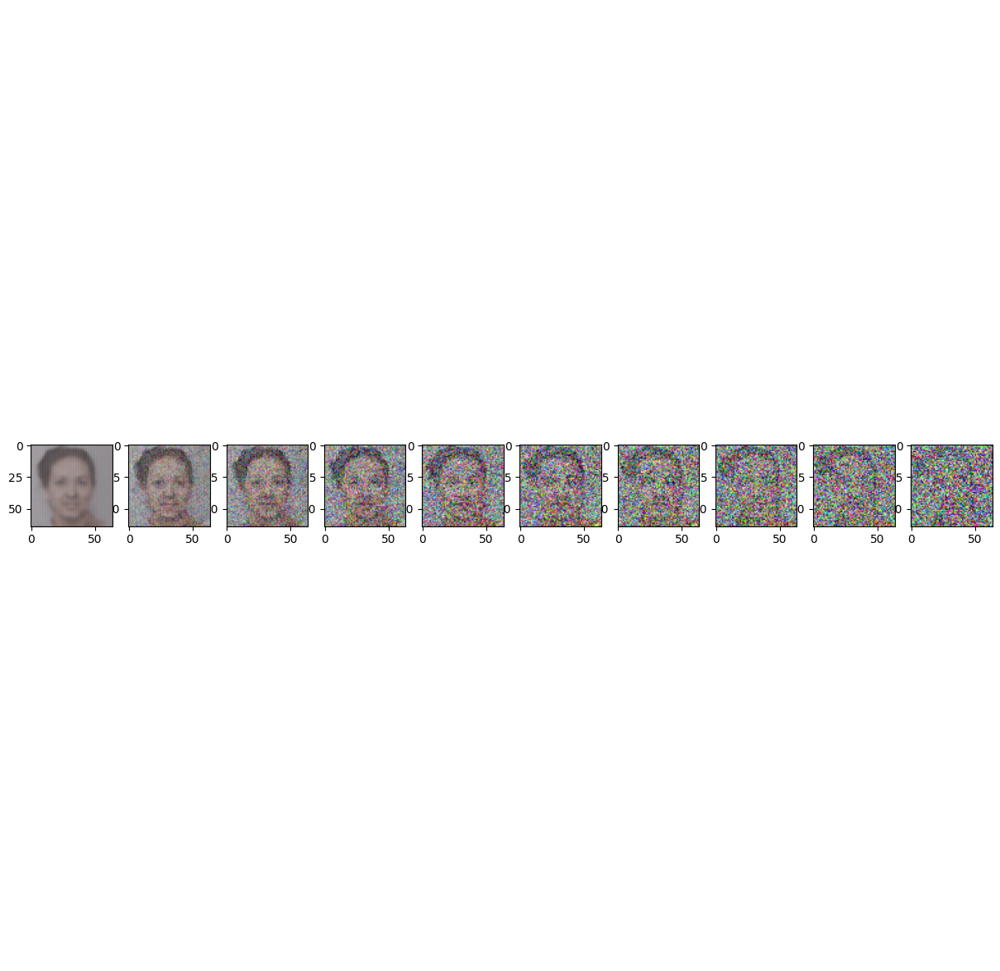

Epoch 55 | step 001 Loss: 0.10148543119430542 
Epoch 55 | step 002 Loss: 0.10502912849187851 
Epoch 55 | step 003 Loss: 0.09384068101644516 
Epoch 55 | step 004 Loss: 0.08048978447914124 
Epoch 55 | step 005 Loss: 0.0849984735250473 
Epoch 55 | step 006 Loss: 0.09138453006744385 
Epoch 55 | step 007 Loss: 0.07174404710531235 
Epoch 55 | step 008 Loss: 0.07918742299079895 
Epoch 55 | step 009 Loss: 0.07882800698280334 
Epoch 55 | step 010 Loss: 0.0737830176949501 
Epoch 55 | step 011 Loss: 0.08683614432811737 
Epoch 55 | step 012 Loss: 0.09786510467529297 
Epoch 55 | step 013 Loss: 0.10051432251930237 
Epoch 55 | step 014 Loss: 0.07652336359024048 
Epoch 55 | step 015 Loss: 0.0988210067152977 
Epoch 55 | step 016 Loss: 0.08762030303478241 
Epoch 55 | step 017 Loss: 0.07627999782562256 
Epoch 55 | step 018 Loss: 0.06745009869337082 
Epoch 55 | step 019 Loss: 0.07513799518346786 
Epoch 55 | step 020 Loss: 0.08020030707120895 
Epoch 55 | step 021 Loss: 0.08257914334535599 
Epoch 55 | step 

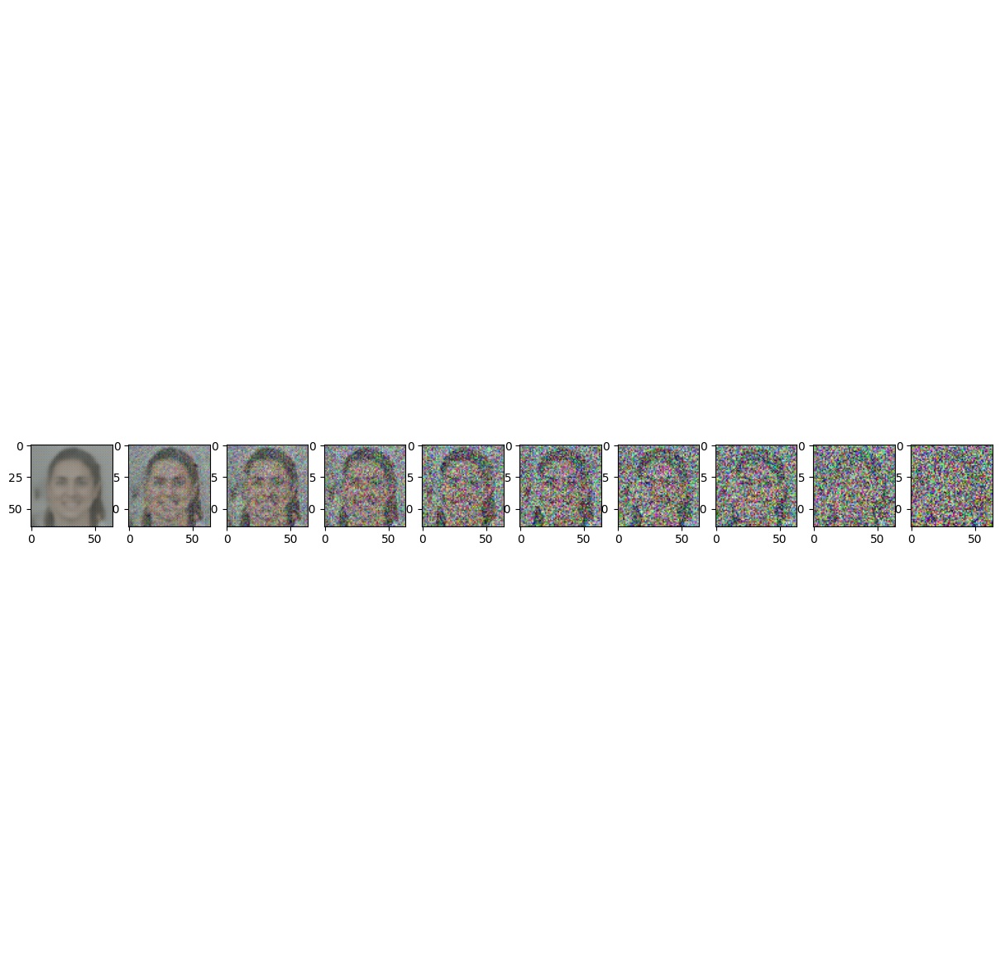

Epoch 60 | step 001 Loss: 0.08447548002004623 
Epoch 60 | step 002 Loss: 0.09844281524419785 
Epoch 60 | step 003 Loss: 0.08419354259967804 
Epoch 60 | step 004 Loss: 0.09687623381614685 
Epoch 60 | step 005 Loss: 0.09445242583751678 
Epoch 60 | step 006 Loss: 0.08381359279155731 
Epoch 60 | step 007 Loss: 0.0693158358335495 
Epoch 60 | step 008 Loss: 0.1200721487402916 
Epoch 60 | step 009 Loss: 0.06464360654354095 
Epoch 60 | step 010 Loss: 0.08036603033542633 
Epoch 60 | step 011 Loss: 0.1028214693069458 
Epoch 60 | step 012 Loss: 0.09632318466901779 
Epoch 60 | step 013 Loss: 0.09639673680067062 
Epoch 60 | step 014 Loss: 0.09892123192548752 
Epoch 60 | step 015 Loss: 0.07701580226421356 
Epoch 60 | step 016 Loss: 0.07666368782520294 
Epoch 60 | step 017 Loss: 0.08332159370183945 
Epoch 60 | step 018 Loss: 0.07063823938369751 
Epoch 60 | step 019 Loss: 0.0906851515173912 
Epoch 60 | step 020 Loss: 0.08316884934902191 
Epoch 60 | step 021 Loss: 0.09098190069198608 
Epoch 60 | step 0

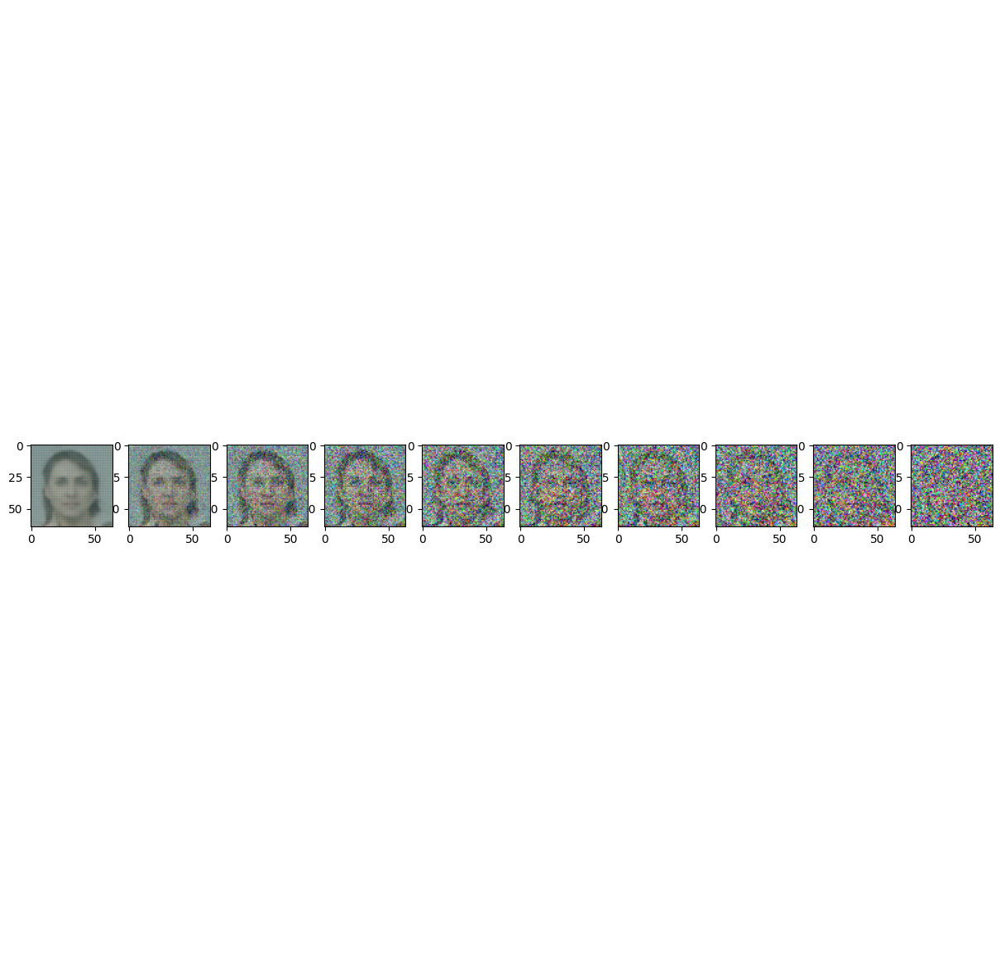

Epoch 65 | step 001 Loss: 0.06849227100610733 
Epoch 65 | step 002 Loss: 0.07285944372415543 
Epoch 65 | step 003 Loss: 0.08721446990966797 
Epoch 65 | step 004 Loss: 0.0855417251586914 
Epoch 65 | step 005 Loss: 0.07588189095258713 
Epoch 65 | step 006 Loss: 0.10321971774101257 
Epoch 65 | step 007 Loss: 0.11135443300008774 
Epoch 65 | step 008 Loss: 0.08740995824337006 
Epoch 65 | step 009 Loss: 0.09453922510147095 
Epoch 65 | step 010 Loss: 0.09839846193790436 
Epoch 65 | step 011 Loss: 0.0981660708785057 
Epoch 65 | step 012 Loss: 0.06411084532737732 
Epoch 65 | step 013 Loss: 0.0842098519206047 
Epoch 65 | step 014 Loss: 0.07514258474111557 
Epoch 65 | step 015 Loss: 0.07864229381084442 
Epoch 65 | step 016 Loss: 0.08652244508266449 
Epoch 65 | step 017 Loss: 0.07959979772567749 
Epoch 65 | step 018 Loss: 0.08910095691680908 
Epoch 65 | step 019 Loss: 0.07872211188077927 
Epoch 65 | step 020 Loss: 0.09806898236274719 
Epoch 65 | step 021 Loss: 0.07451091706752777 
Epoch 65 | step 

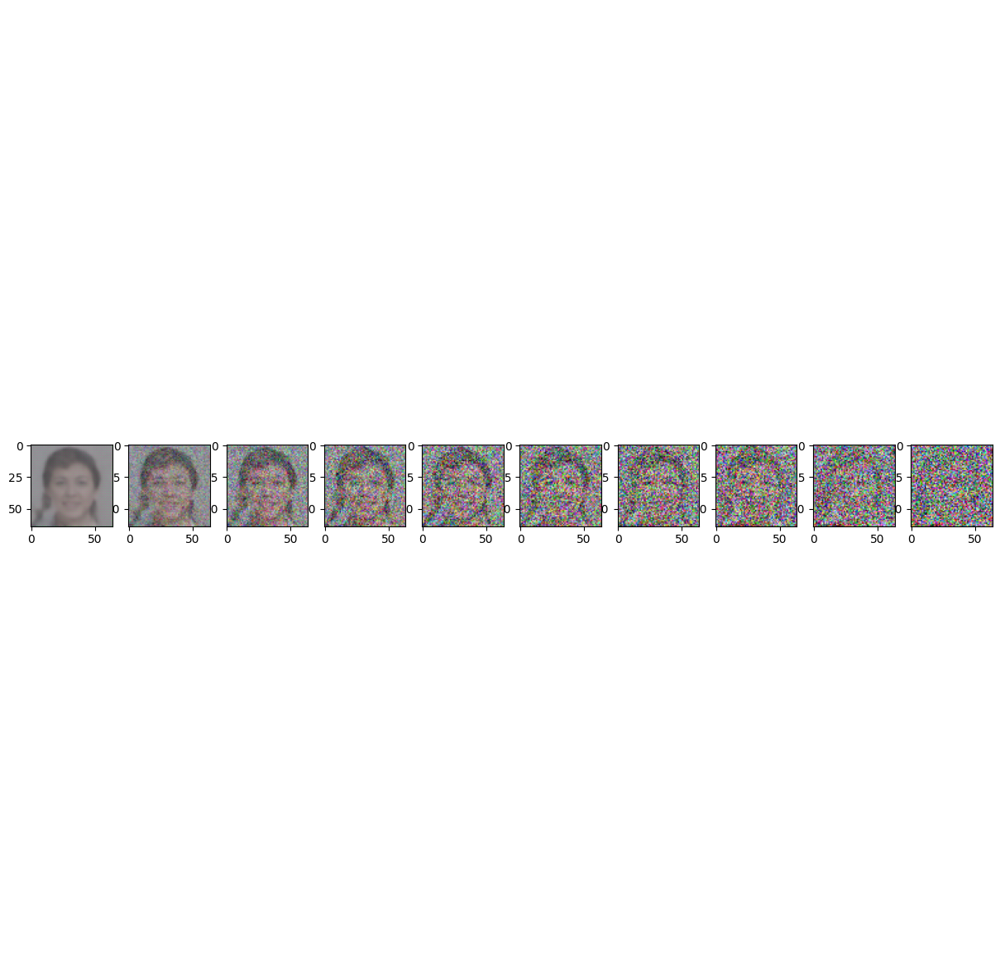

Epoch 70 | step 001 Loss: 0.08153635263442993 
Epoch 70 | step 002 Loss: 0.06604482233524323 
Epoch 70 | step 003 Loss: 0.09702633321285248 
Epoch 70 | step 004 Loss: 0.09358227252960205 
Epoch 70 | step 005 Loss: 0.08268259465694427 
Epoch 70 | step 006 Loss: 0.07848416268825531 
Epoch 70 | step 007 Loss: 0.08184998482465744 
Epoch 70 | step 008 Loss: 0.08853714913129807 
Epoch 70 | step 009 Loss: 0.09266059845685959 
Epoch 70 | step 010 Loss: 0.07091536372900009 
Epoch 70 | step 011 Loss: 0.10574816912412643 
Epoch 70 | step 012 Loss: 0.08517710864543915 
Epoch 70 | step 013 Loss: 0.08301770687103271 
Epoch 70 | step 014 Loss: 0.0950252041220665 
Epoch 70 | step 015 Loss: 0.09109856933355331 
Epoch 70 | step 016 Loss: 0.09631841629743576 
Epoch 70 | step 017 Loss: 0.08029796183109283 
Epoch 70 | step 018 Loss: 0.09921807050704956 
Epoch 70 | step 019 Loss: 0.11294823884963989 
Epoch 70 | step 020 Loss: 0.0951678603887558 
Epoch 70 | step 021 Loss: 0.0651550218462944 
Epoch 70 | step 

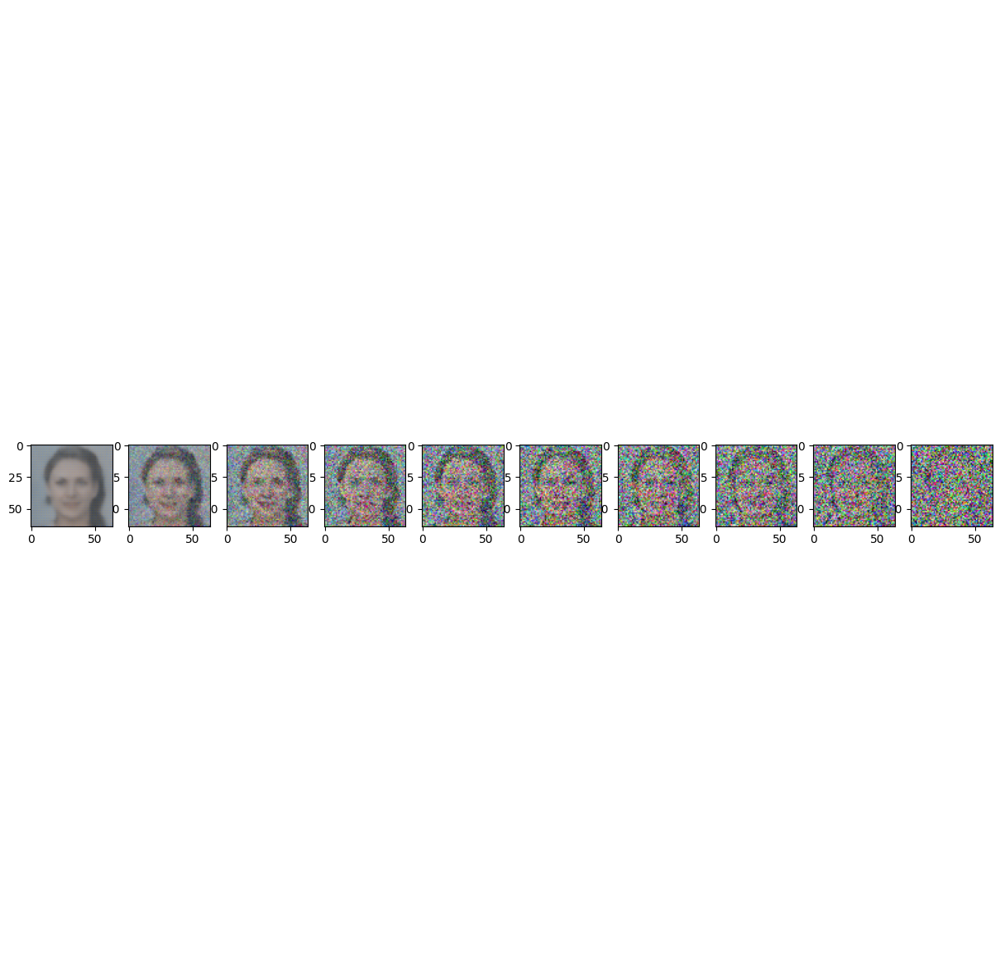

Epoch 75 | step 001 Loss: 0.08332675695419312 
Epoch 75 | step 002 Loss: 0.07246975600719452 
Epoch 75 | step 003 Loss: 0.08948447555303574 
Epoch 75 | step 004 Loss: 0.07770486176013947 
Epoch 75 | step 005 Loss: 0.07188203930854797 
Epoch 75 | step 006 Loss: 0.07451365143060684 
Epoch 75 | step 007 Loss: 0.07245224714279175 
Epoch 75 | step 008 Loss: 0.10001130402088165 
Epoch 75 | step 009 Loss: 0.09020134061574936 
Epoch 75 | step 010 Loss: 0.10252071917057037 
Epoch 75 | step 011 Loss: 0.08476432412862778 
Epoch 75 | step 012 Loss: 0.08235040307044983 
Epoch 75 | step 013 Loss: 0.08059366047382355 
Epoch 75 | step 014 Loss: 0.0735517367720604 
Epoch 75 | step 015 Loss: 0.09506061673164368 
Epoch 75 | step 016 Loss: 0.09586338698863983 
Epoch 75 | step 017 Loss: 0.08955590426921844 
Epoch 75 | step 018 Loss: 0.09032808244228363 
Epoch 75 | step 019 Loss: 0.1074371337890625 
Epoch 75 | step 020 Loss: 0.07729886472225189 
Epoch 75 | step 021 Loss: 0.09130597114562988 
Epoch 75 | step

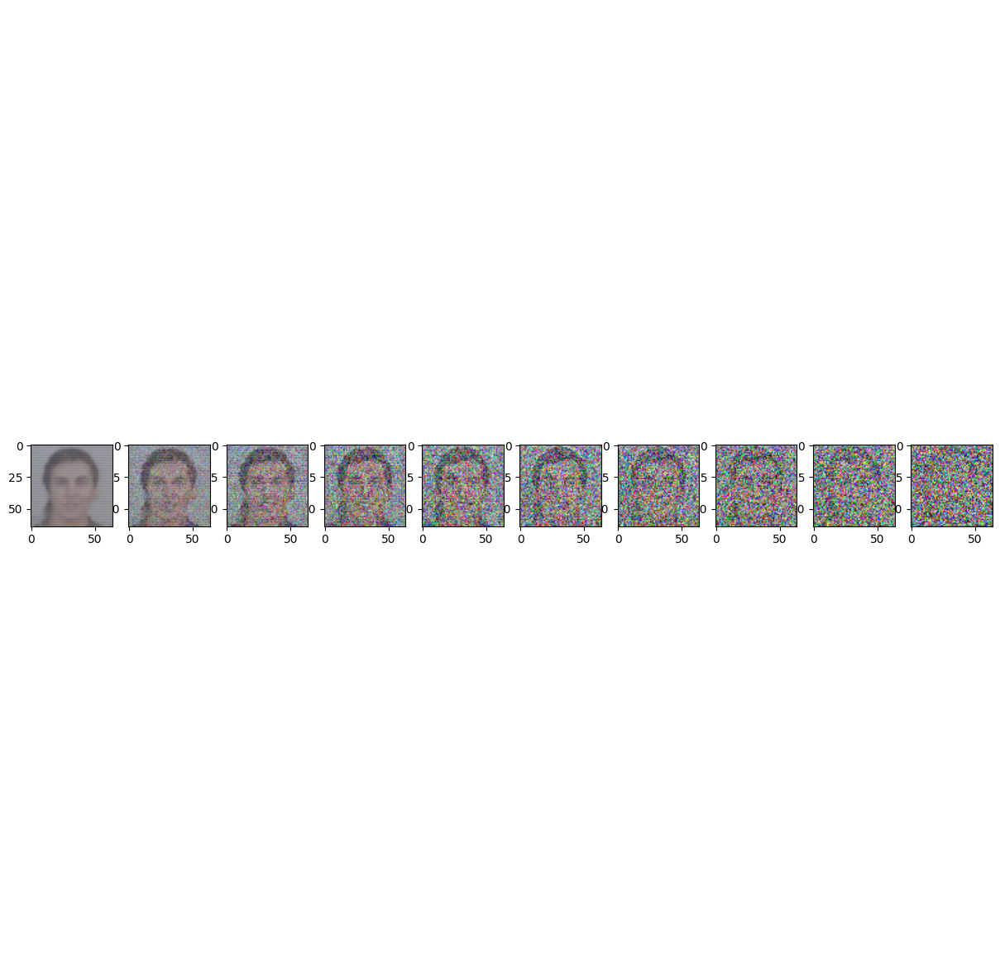

Epoch 80 | step 001 Loss: 0.08742593228816986 
Epoch 80 | step 002 Loss: 0.082121841609478 
Epoch 80 | step 003 Loss: 0.07791277766227722 
Epoch 80 | step 004 Loss: 0.06888623535633087 
Epoch 80 | step 005 Loss: 0.07896337658166885 
Epoch 80 | step 006 Loss: 0.12116178870201111 
Epoch 80 | step 007 Loss: 0.08450259268283844 
Epoch 80 | step 008 Loss: 0.08854838460683823 
Epoch 80 | step 009 Loss: 0.06680850684642792 
Epoch 80 | step 010 Loss: 0.08407558500766754 
Epoch 80 | step 011 Loss: 0.08487939089536667 
Epoch 80 | step 012 Loss: 0.1163095235824585 
Epoch 80 | step 013 Loss: 0.08507122844457626 
Epoch 80 | step 014 Loss: 0.0757874846458435 
Epoch 80 | step 015 Loss: 0.08748497813940048 
Epoch 80 | step 016 Loss: 0.07215285301208496 
Epoch 80 | step 017 Loss: 0.08388891071081161 
Epoch 80 | step 018 Loss: 0.10451284050941467 
Epoch 80 | step 019 Loss: 0.08288230746984482 
Epoch 80 | step 020 Loss: 0.07760115712881088 
Epoch 80 | step 021 Loss: 0.1003894954919815 
Epoch 80 | step 02

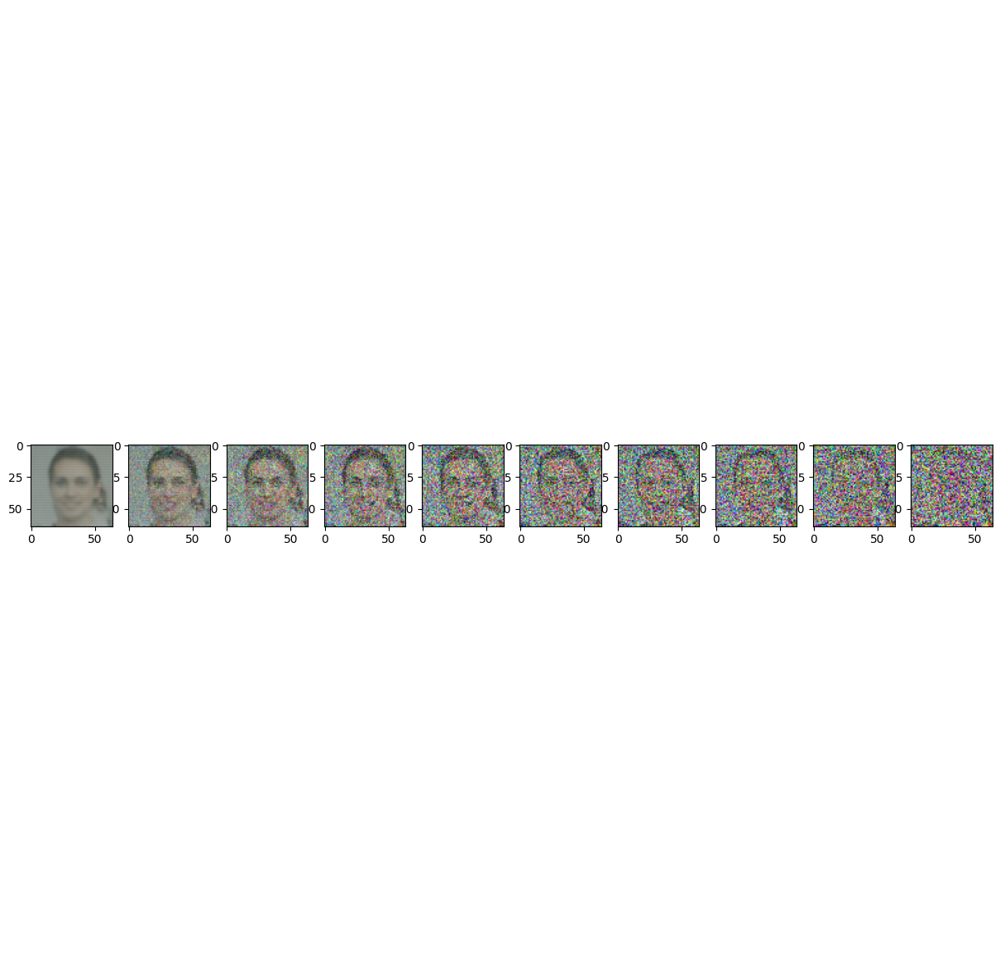

Epoch 85 | step 001 Loss: 0.07588116824626923 
Epoch 85 | step 002 Loss: 0.08082415163516998 
Epoch 85 | step 003 Loss: 0.1005844920873642 
Epoch 85 | step 004 Loss: 0.08003190159797668 
Epoch 85 | step 005 Loss: 0.08389784395694733 
Epoch 85 | step 006 Loss: 0.08373262733221054 
Epoch 85 | step 007 Loss: 0.08873989433050156 
Epoch 85 | step 008 Loss: 0.08451555669307709 
Epoch 85 | step 009 Loss: 0.0685855969786644 
Epoch 85 | step 010 Loss: 0.07622373849153519 
Epoch 85 | step 011 Loss: 0.07484275847673416 
Epoch 85 | step 012 Loss: 0.08905775845050812 
Epoch 85 | step 013 Loss: 0.09650738537311554 
Epoch 85 | step 014 Loss: 0.09630349278450012 
Epoch 85 | step 015 Loss: 0.07042685151100159 
Epoch 85 | step 016 Loss: 0.09365367144346237 
Epoch 85 | step 017 Loss: 0.11281716078519821 
Epoch 85 | step 018 Loss: 0.09151104092597961 
Epoch 85 | step 019 Loss: 0.07871745526790619 
Epoch 85 | step 020 Loss: 0.07097259163856506 
Epoch 85 | step 021 Loss: 0.08569841086864471 
Epoch 85 | step

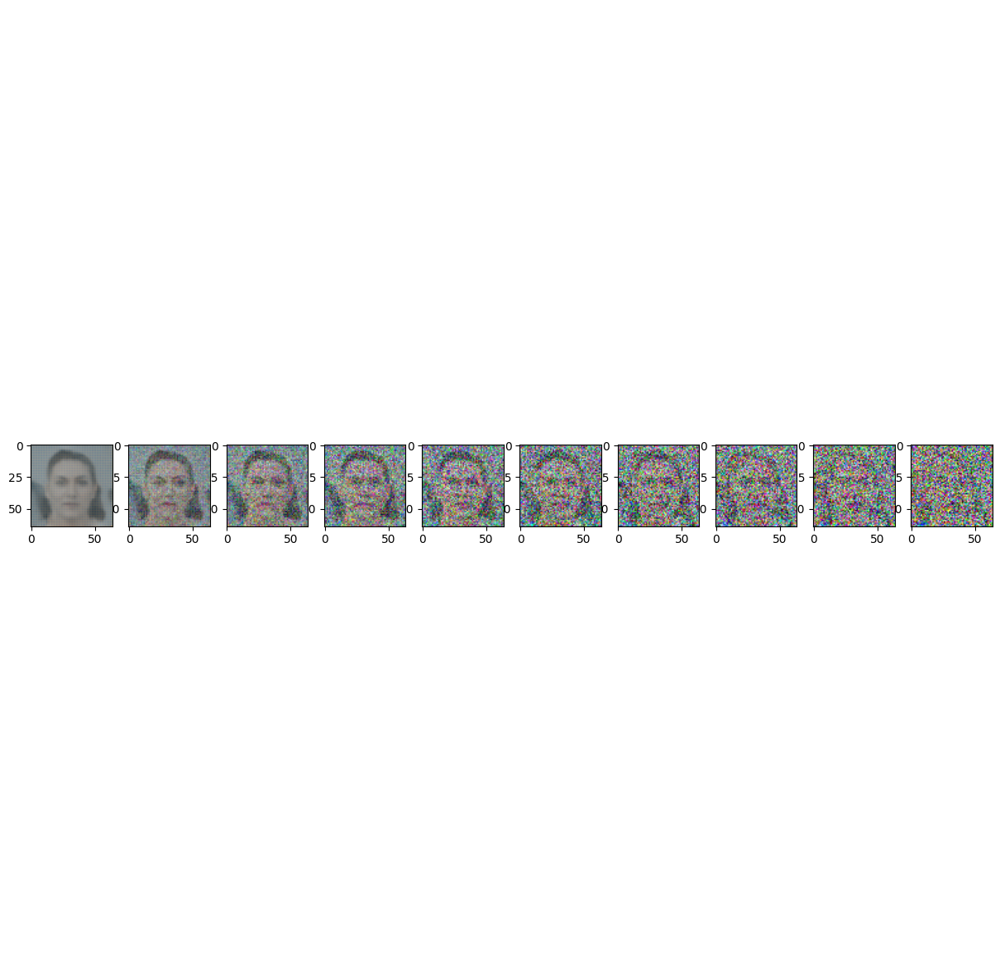

Epoch 90 | step 001 Loss: 0.08059487491846085 
Epoch 90 | step 002 Loss: 0.08770552277565002 
Epoch 90 | step 003 Loss: 0.0787530466914177 
Epoch 90 | step 004 Loss: 0.065529964864254 
Epoch 90 | step 005 Loss: 0.08847494423389435 
Epoch 90 | step 006 Loss: 0.07550432533025742 
Epoch 90 | step 007 Loss: 0.061735332012176514 
Epoch 90 | step 008 Loss: 0.06886430084705353 
Epoch 90 | step 009 Loss: 0.0841749906539917 
Epoch 90 | step 010 Loss: 0.07542163878679276 
Epoch 90 | step 011 Loss: 0.09408675879240036 
Epoch 90 | step 012 Loss: 0.07144981622695923 
Epoch 90 | step 013 Loss: 0.0840245932340622 
Epoch 90 | step 014 Loss: 0.06259918212890625 
Epoch 90 | step 015 Loss: 0.07448490709066391 
Epoch 90 | step 016 Loss: 0.08338262885808945 
Epoch 90 | step 017 Loss: 0.07410562038421631 
Epoch 90 | step 018 Loss: 0.08178066462278366 
Epoch 90 | step 019 Loss: 0.0806707963347435 
Epoch 90 | step 020 Loss: 0.08224956691265106 
Epoch 90 | step 021 Loss: 0.07191403955221176 
Epoch 90 | step 02

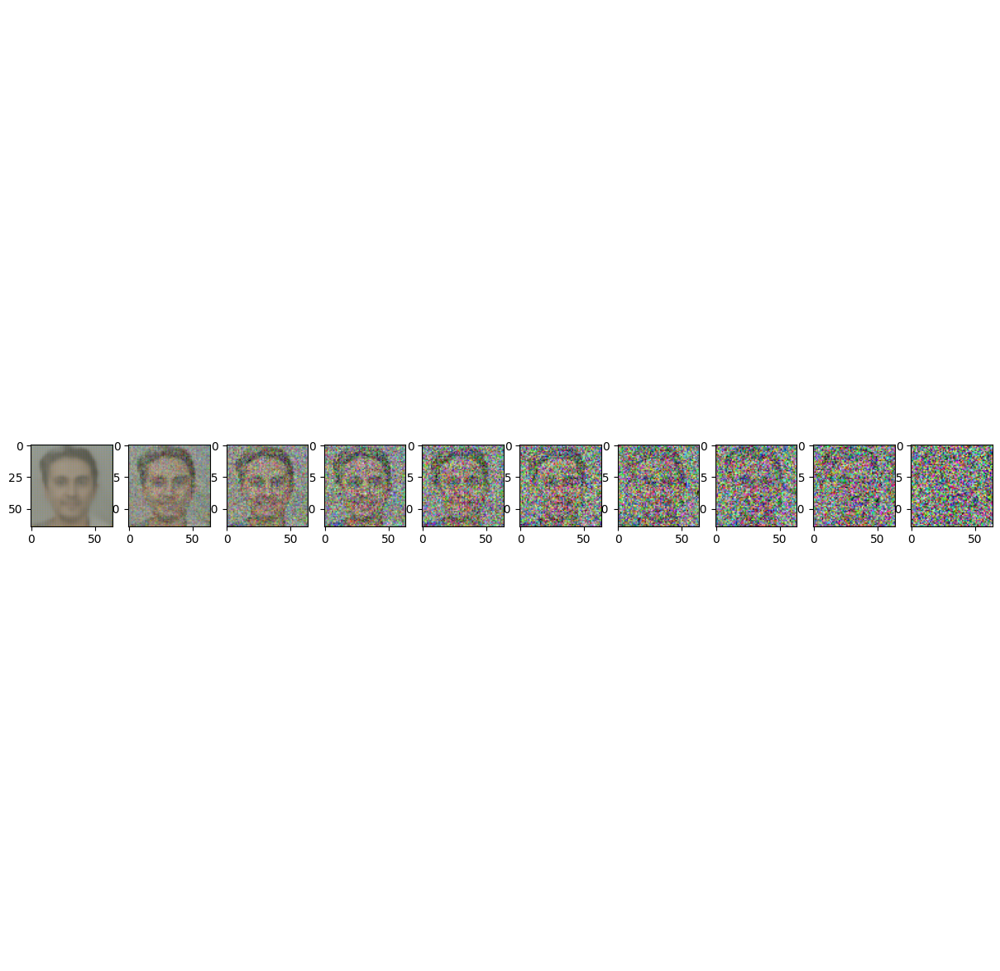

Epoch 95 | step 001 Loss: 0.07172108441591263 
Epoch 95 | step 002 Loss: 0.07948079705238342 
Epoch 95 | step 003 Loss: 0.08291164040565491 
Epoch 95 | step 004 Loss: 0.062023431062698364 
Epoch 95 | step 005 Loss: 0.08047424256801605 
Epoch 95 | step 006 Loss: 0.07716183364391327 
Epoch 95 | step 007 Loss: 0.10432033240795135 
Epoch 95 | step 008 Loss: 0.06420400738716125 
Epoch 95 | step 009 Loss: 0.06097351759672165 
Epoch 95 | step 010 Loss: 0.09078125655651093 
Epoch 95 | step 011 Loss: 0.09159345924854279 
Epoch 95 | step 012 Loss: 0.08597104251384735 
Epoch 95 | step 013 Loss: 0.08159030973911285 
Epoch 95 | step 014 Loss: 0.06767334043979645 
Epoch 95 | step 015 Loss: 0.07285400480031967 
Epoch 95 | step 016 Loss: 0.06714130938053131 
Epoch 95 | step 017 Loss: 0.09751832485198975 
Epoch 95 | step 018 Loss: 0.10094714164733887 
Epoch 95 | step 019 Loss: 0.09301258623600006 
Epoch 95 | step 020 Loss: 0.09509490430355072 
Epoch 95 | step 021 Loss: 0.07712666690349579 
Epoch 95 | s

In [ ]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 200 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        if step == 0:
          sample_plot_image()

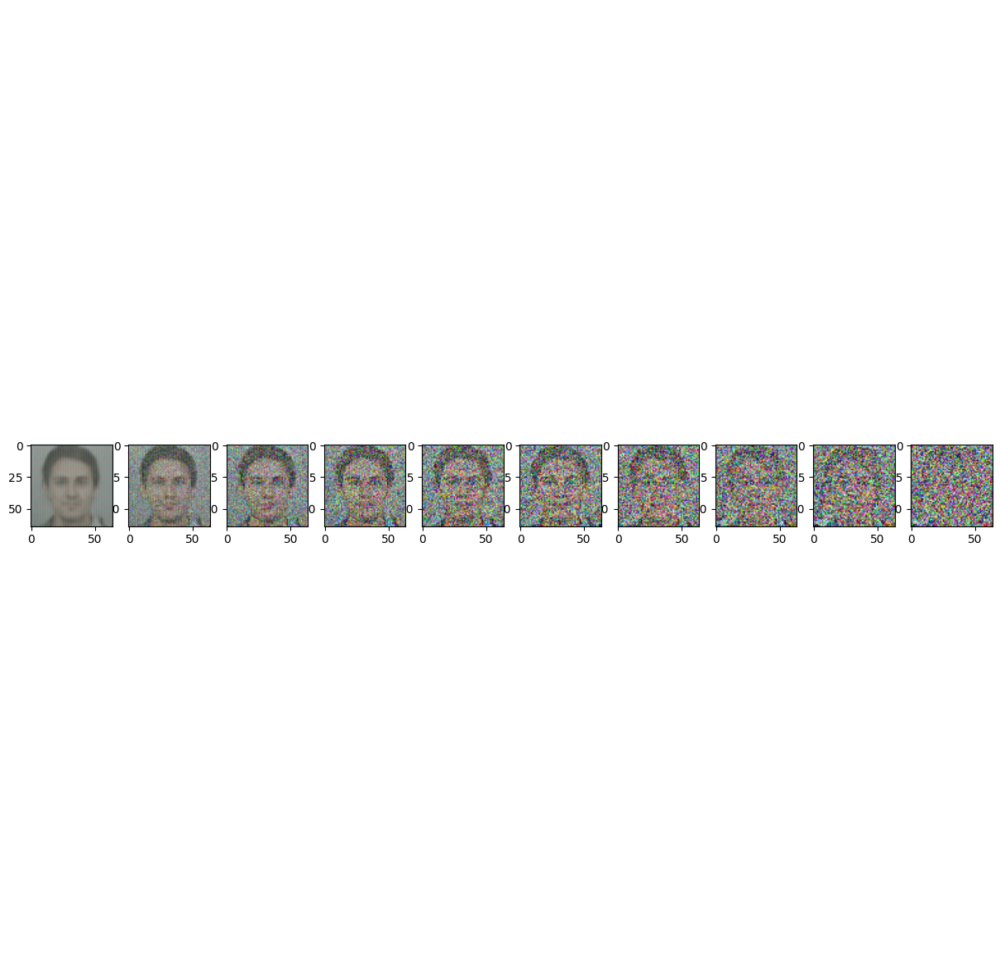

In [22]:
sample_plot_image()

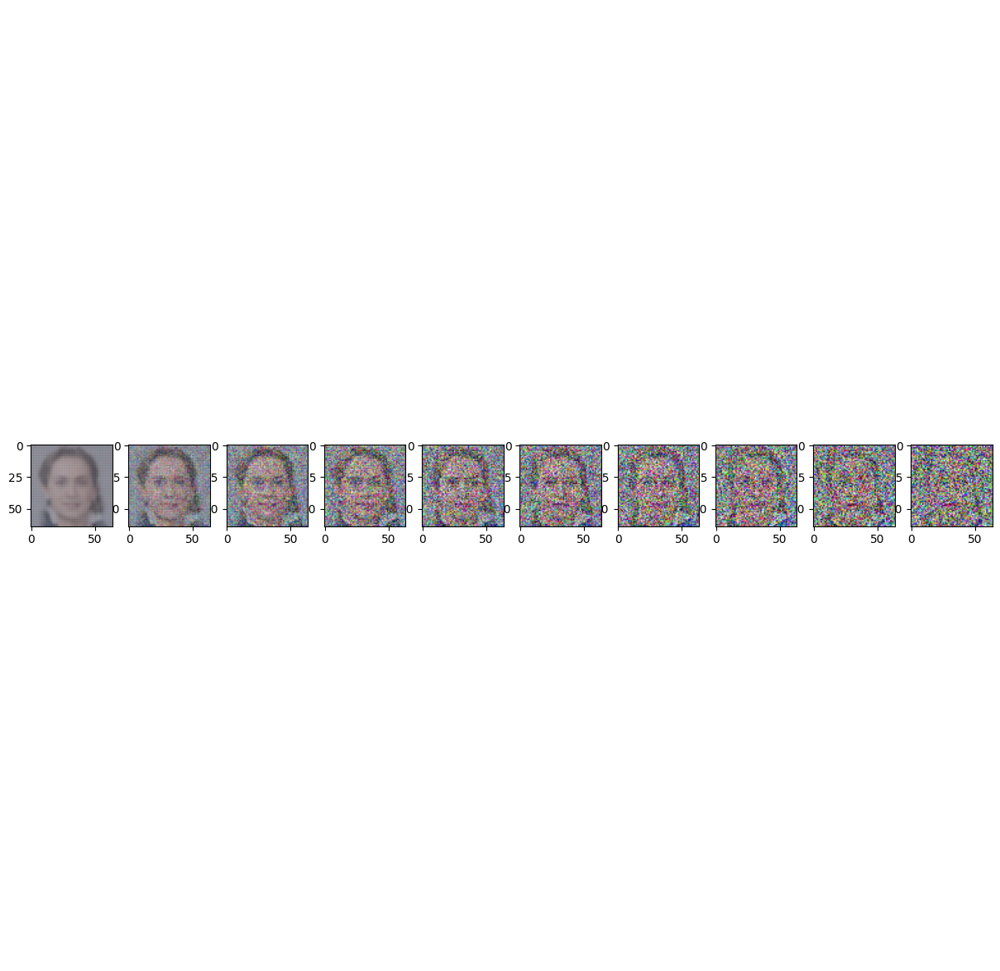

In [17]:
# Save model
torch.save(model.state_dict(), "model.pth")
# Load model
model = SimpleUnet()
model.load_state_dict(torch.load("model.pth"))
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
sample_plot_image()